In [1]:
import os
os.chdir('/engram/nklab/hossein/recurrent_models/BLT_models')
!pwd

%matplotlib inline 
import matplotlib.pyplot as plt

import datasets
import pandas as pd
import numpy as np
import csv
import torch
from matplotlib.patches import Rectangle
import torchvision
from PIL import Image
from models.cornet import get_cornet_model
import torch.nn as nn
from collections import OrderedDict
import rsatoolbox
import torch.nn.functional as F

import warnings
warnings.filterwarnings("ignore")

device = 'cuda' if torch.cuda.is_available() else 'cpu'

from analyze_representations import sample_vggface2, calc_rdms, plot_maps, compare_rdms,\
  plot_recurrent_rdms, reduce_dim, plot_dim_reduction_one, sample_FEI_dataset, \
  plot_rdm_mds, load_model_path, load_pretrained_models, extract_features, kasper_dataset

/engram/nklab/hossein/recurrent_models/BLT_models


In [2]:
# load the dataset
imgs, labels, neuro_data = kasper_dataset()

In [3]:
# load the model and plot the RDMs/MDS
model, gap = load_model_path('./results/classification/vggface2/blt_b_pm/run_2/', print_model=False)
layers = ['output_5','output_4','output_3'] #, 'output_4','output_3', 'output_2', 'output_1', 'output_0'] #, 'output_4','output_3', 'output_2', 'output_1', 'output_0'
save = None #'dynamics_imagenet_bl'
# , rdm_method='cka'
plot_rdm_mds(model, imgs, labels, layers, num_steps=1, add_text=False, add_bar=False, save=save, format='png')

OutOfMemoryError: CUDA out of memory. Tried to allocate 846.00 MiB. GPU 

100%|██████████| 5/5 [1:42:48<00:00, 1233.72s/it]


array([0.50980735, 0.55433482, 0.55385694, 0.57452935, 0.54355732,
       0.52686528, 0.53740314, 0.55853569, 0.60112164, 0.51033782,
       0.51506292, 0.42276442])

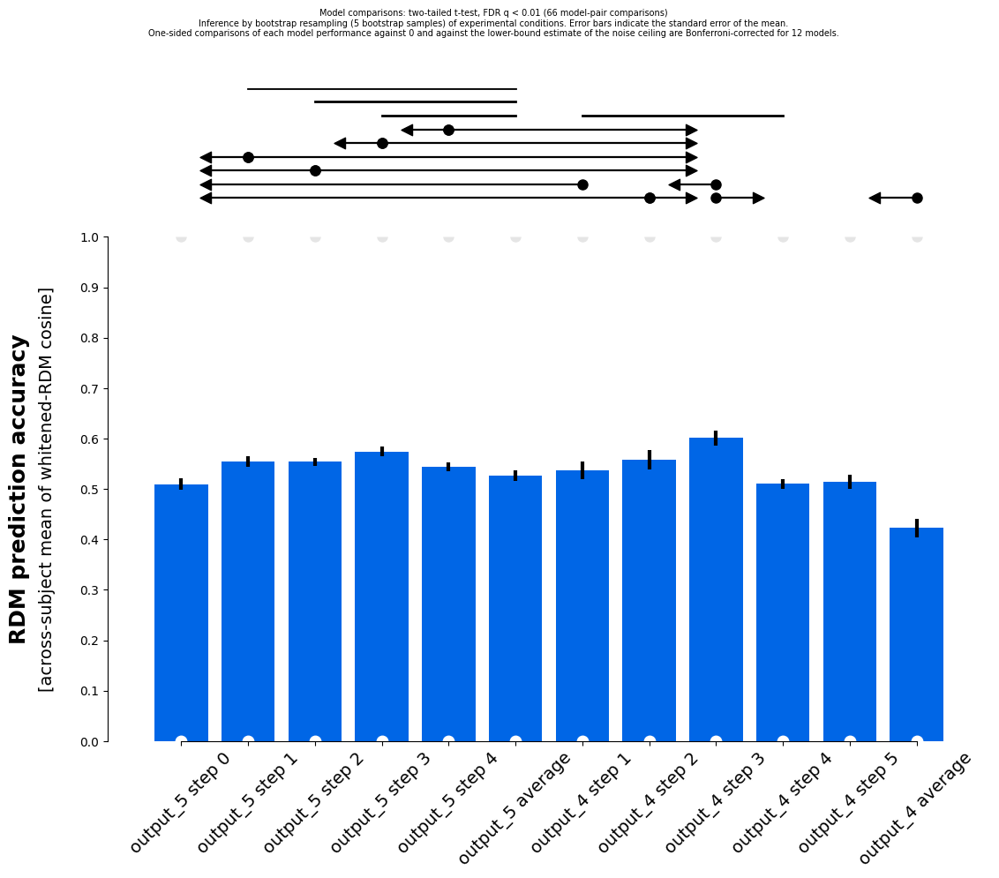

In [4]:
# compare rdms to neuro data -- resamples the images
neuro_data_dict = {'neuro_data':neuro_data}
results, pred_model_names = compare_rdms(model, imgs.to(device), layers, neuro_data_dict, method='cosine_cov', num_steps=5)

results.to_dict()['evaluations'].mean(0)

(1, 138, 25088)
(1, 138, 25088)
(1, 138, 25088)
(1, 138, 25088)
(1, 138, 25088)
(1, 138, 25088)
(1, 138, 25088)
(1, 138, 25088)
(1, 138, 25088)
(1, 137, 25088)
(1, 138, 100352)
(1, 138, 100352)
(1, 138, 100352)
(1, 138, 100352)
(1, 138, 100352)
(1, 138, 100352)
(1, 138, 100352)
(1, 138, 100352)
(1, 138, 100352)
(1, 137, 100352)
(1, 138, 200704)
(1, 138, 200704)
(1, 138, 200704)
(1, 138, 200704)
(1, 138, 200704)
(1, 138, 200704)
(1, 138, 200704)
(1, 138, 200704)
(1, 138, 200704)
(1, 137, 200704)
(1, 138, 200704)
(1, 138, 200704)
(1, 138, 200704)
(1, 138, 200704)
(1, 138, 200704)
(1, 138, 200704)
(1, 138, 200704)
(1, 138, 200704)
(1, 138, 200704)
(1, 137, 200704)
(1, 138, 401408)
(1, 138, 401408)
(1, 138, 401408)
(1, 138, 401408)
(1, 138, 401408)
(1, 138, 401408)
(1, 138, 401408)
(1, 138, 401408)
(1, 138, 401408)
(1, 137, 401408)
(1, 138, 802816)
(1, 138, 802816)
(1, 138, 802816)
(1, 138, 802816)
(1, 138, 802816)
(1, 138, 802816)
(1, 138, 802816)
(1, 138, 802816)
(1, 138, 802816)
(1, 137

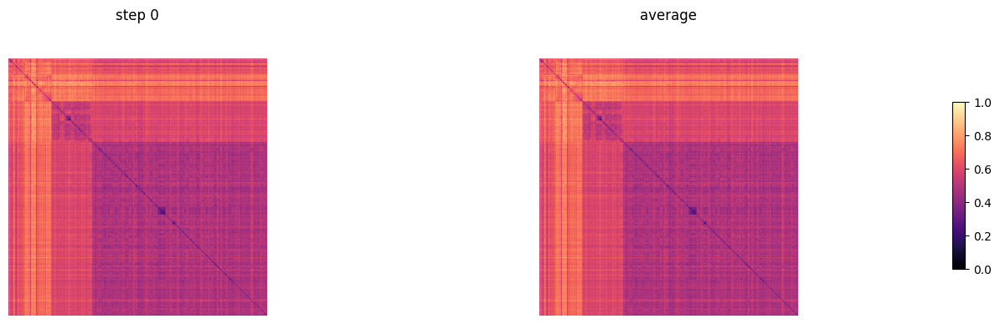

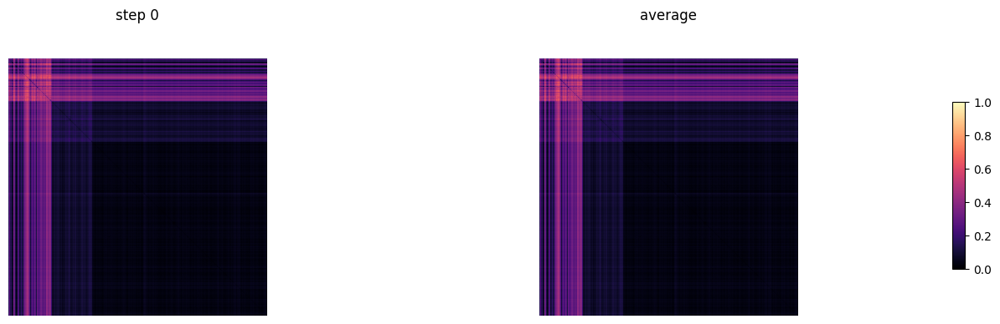

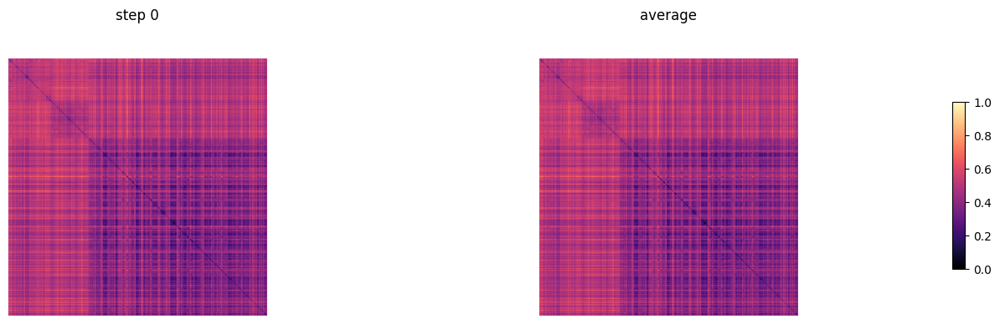

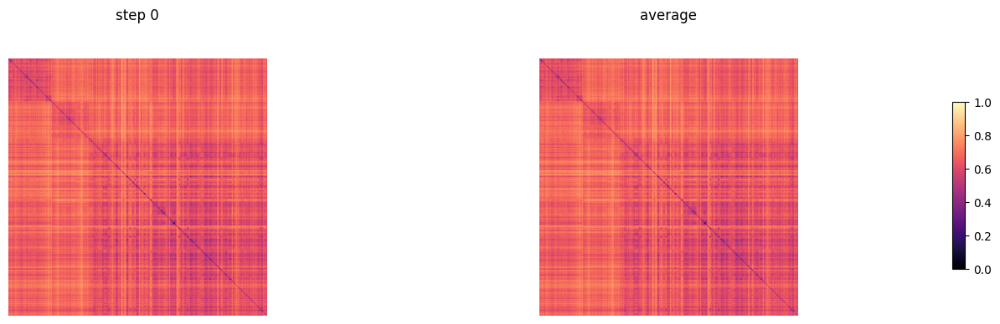

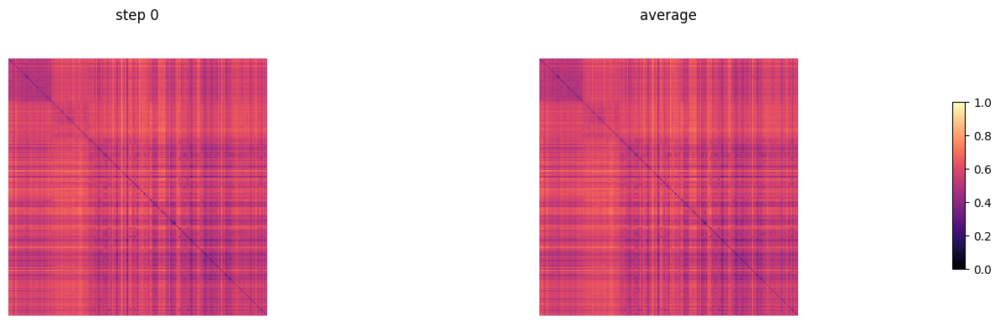

...

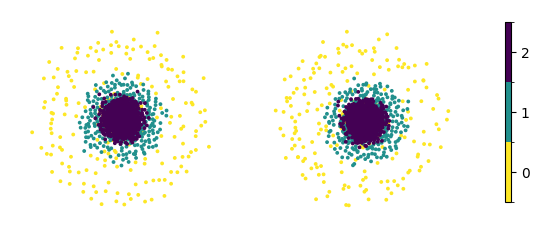

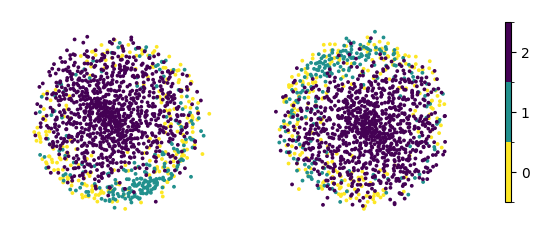

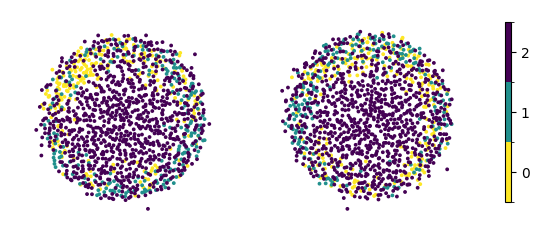

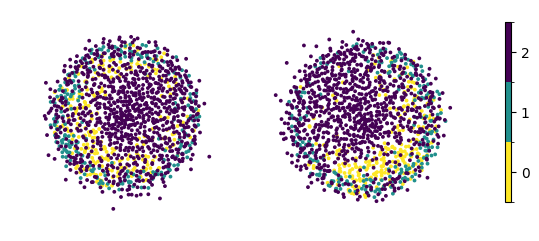

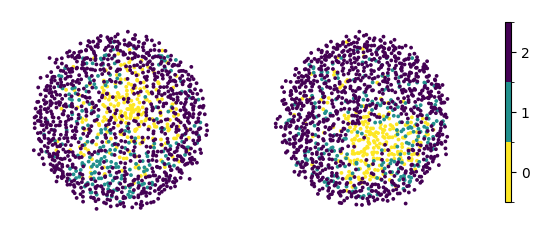

In [3]:
#imgs, labels, neuro_data = kasper_dataset()
model, gap = load_model_path('./results/classification/vggface2/blt_b_pm/run_2/')
layers = ['output_5', 'output_4', 'output_3', 'output_2', 'output_1', 'output_0']
plot_rdm_mds(model, imgs, labels, layers, num_steps=1, save=None)

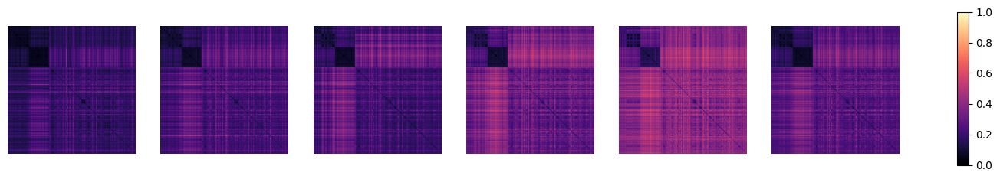

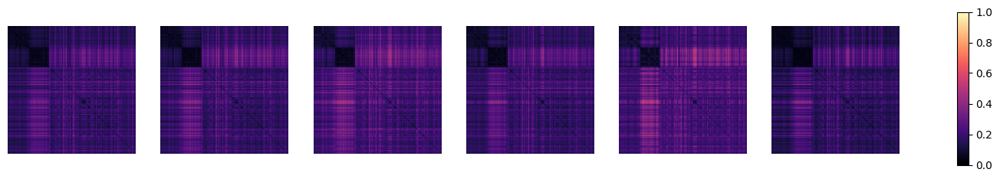

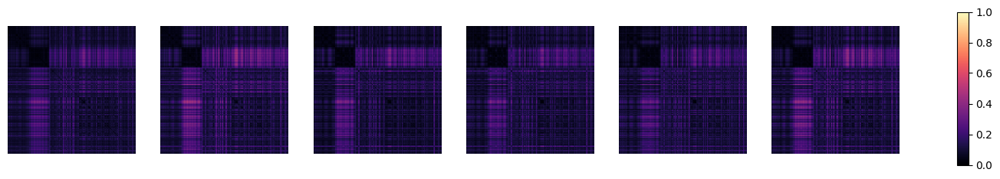

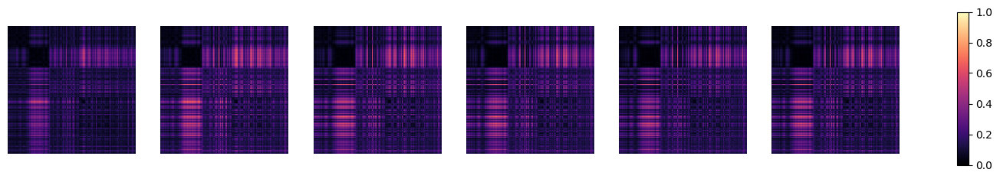

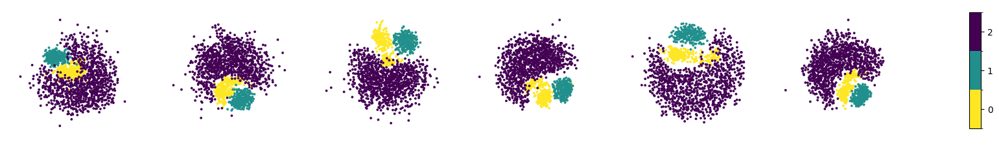

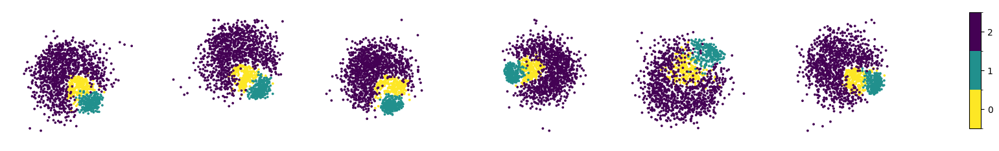

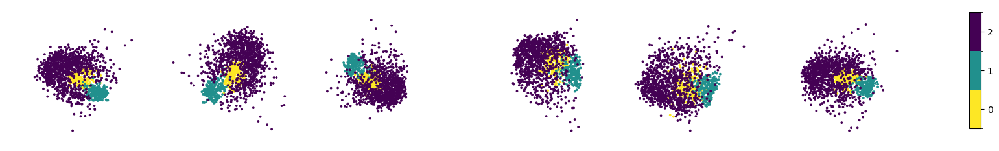

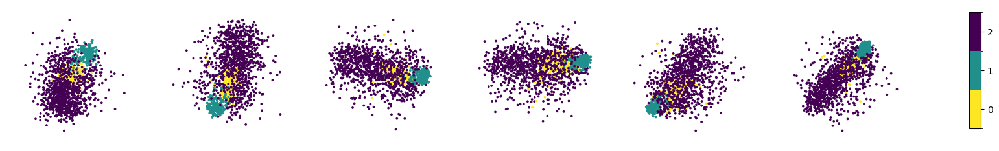

In [5]:
#imgs, labels, neuro_data = kasper_dataset()
model, gap = load_model_path('./results/classification/imagenet_face/blt_bl/run_2/')
layers = ['output_3', 'output_2', 'output_1', 'output_0']
plot_rdm_mds(model, imgs, labels, layers, save=None)

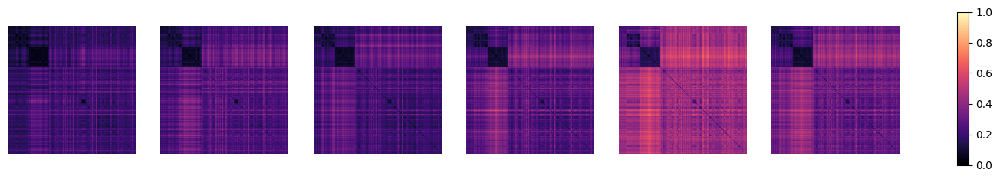

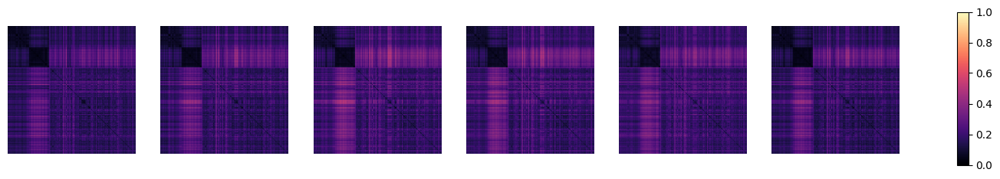

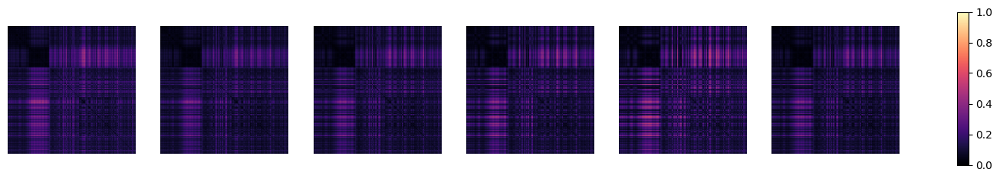

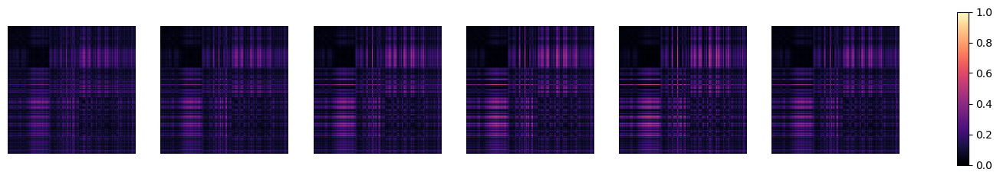

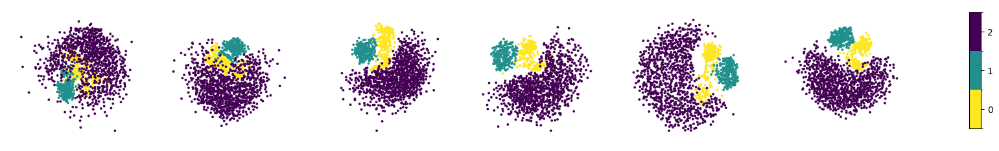

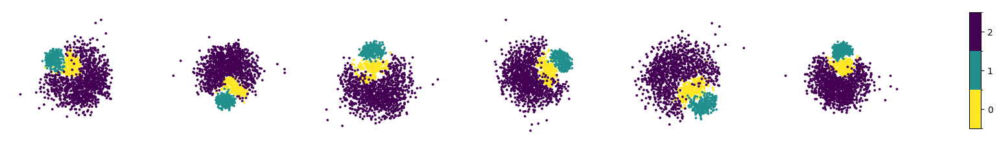

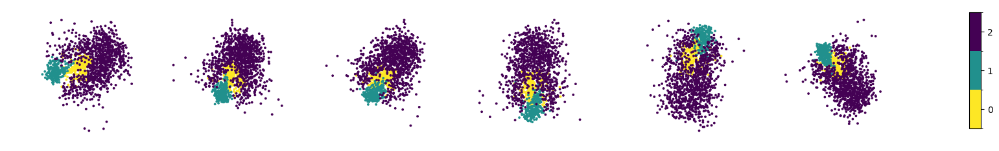

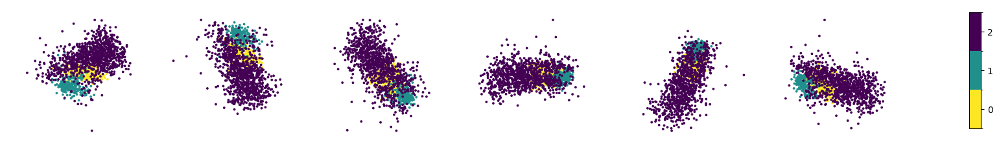

In [6]:
#imgs, labels, neuro_data = kasper_dataset()
model, gap = load_model_path('./results/classification/imagenet/blt_bl/run_2/')
layers = ['output_3', 'output_2', 'output_1', 'output_0']
plot_rdm_mds(model, imgs, labels, layers, save=None)

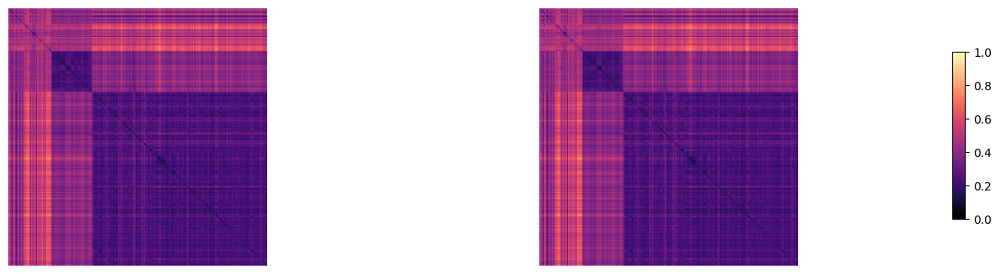

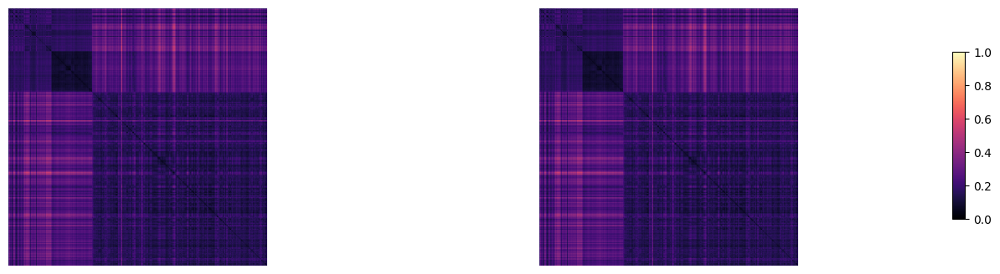

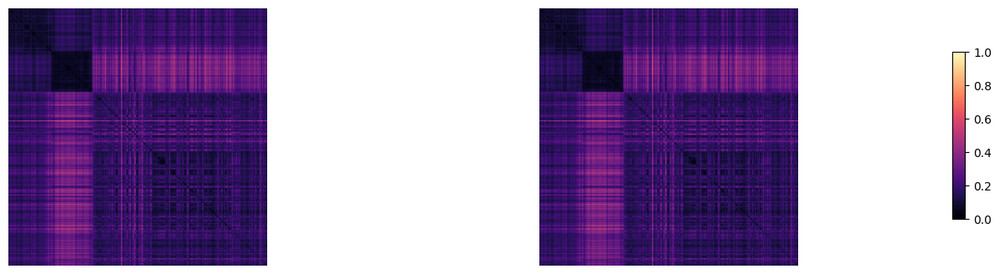

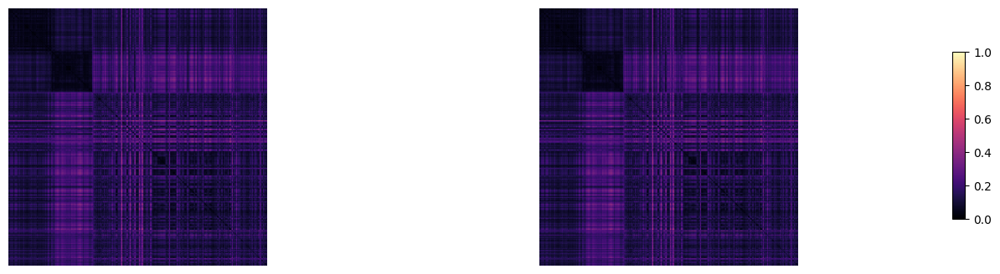

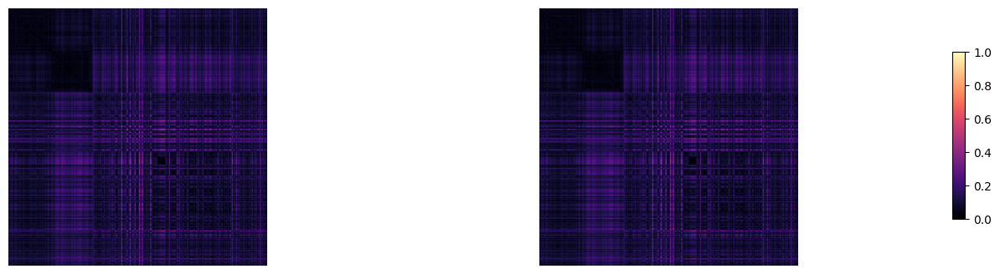

...

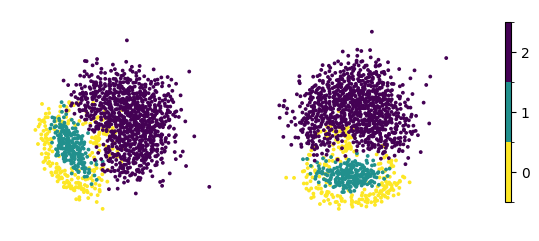

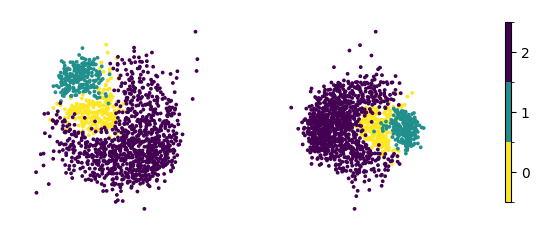

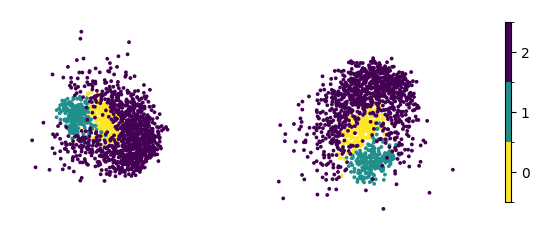

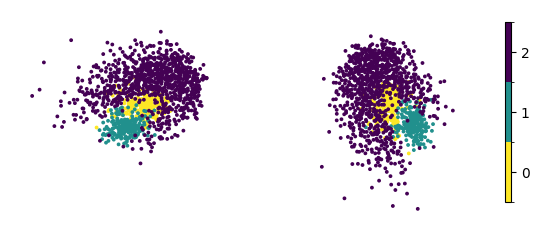

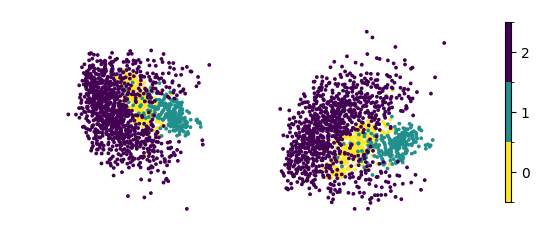

In [7]:
#imgs, labels, neuro_data = kasper_dataset()
model, gap = load_model_path('./results/classification/vggface2/blt_b/run_1/')
layers = ['output_5', 'output_4', 'output_3', 'output_2', 'output_1', 'output_0']
plot_rdm_mds(model, imgs, labels, layers, num_steps=1, save=None)

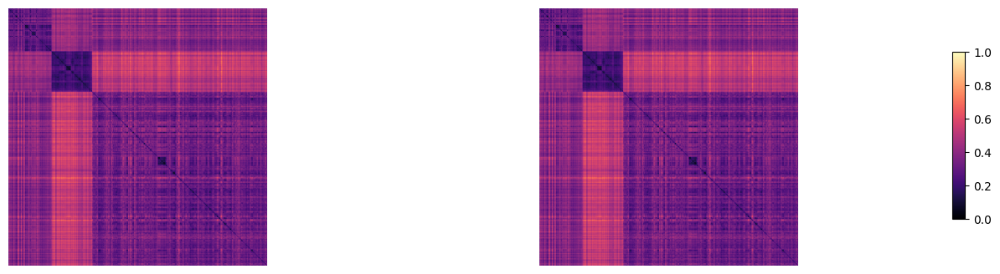

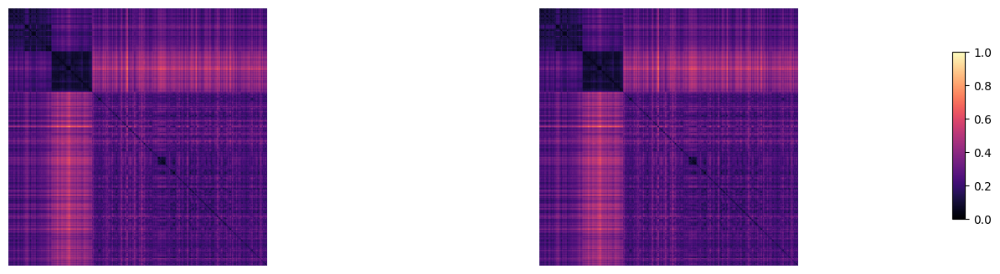

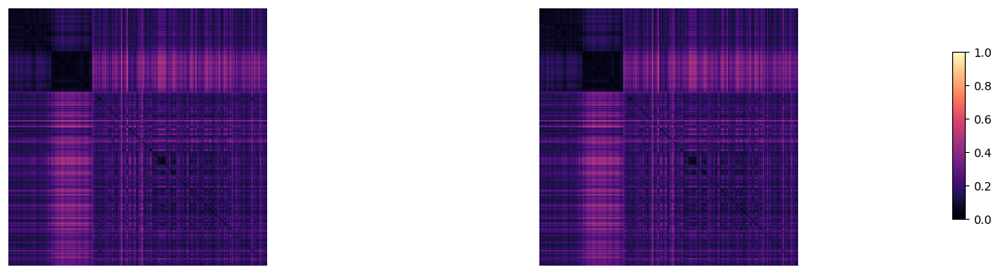

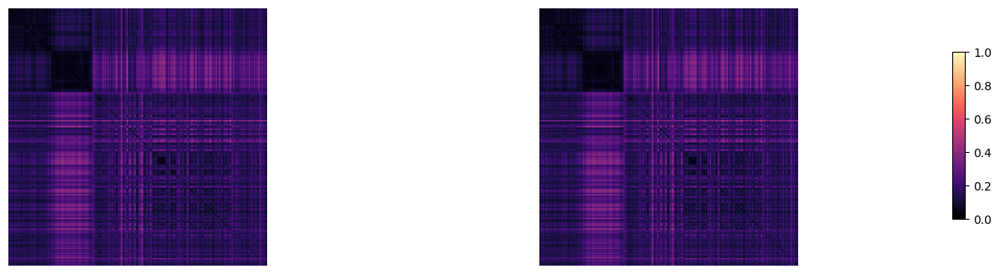

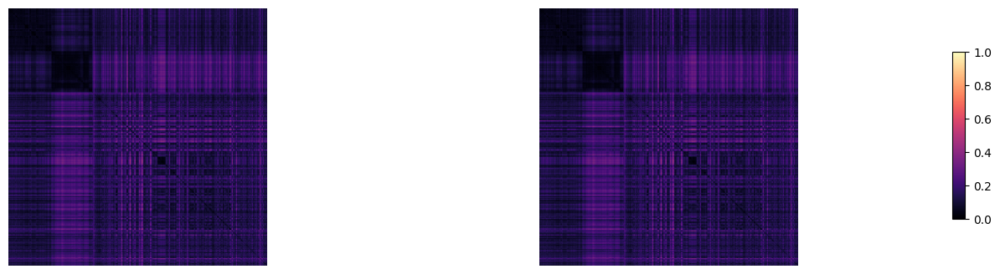

...

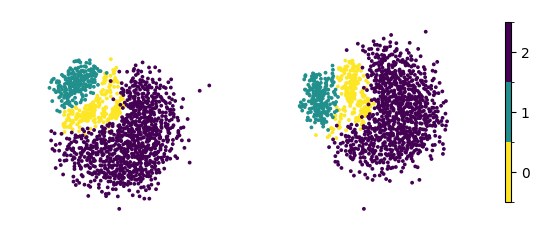

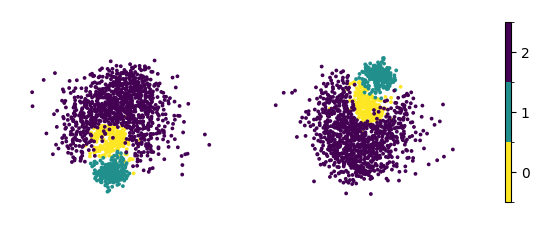

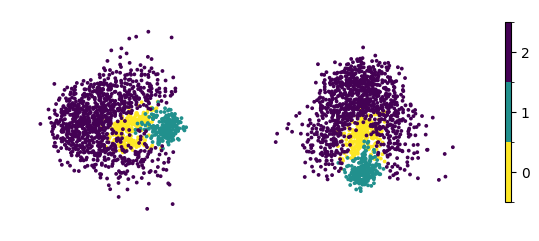

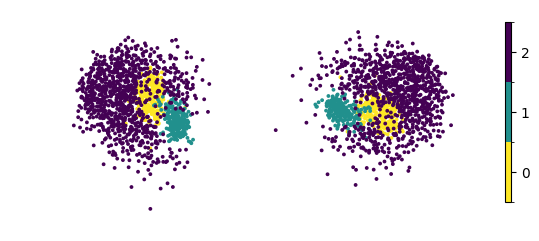

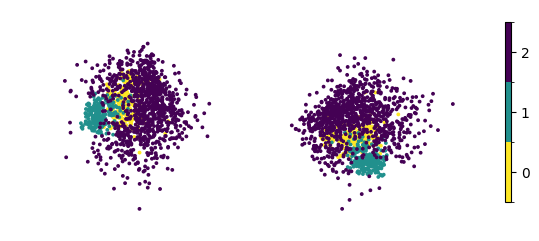

In [8]:
model, gap = load_model_path('./results/classification/imagenet_vggface2/blt_b/run_1/')
layers = ['output_5', 'output_4', 'output_3', 'output_2', 'output_1', 'output_0']
plot_rdm_mds(model, imgs, labels, layers, num_steps=1, save=None)

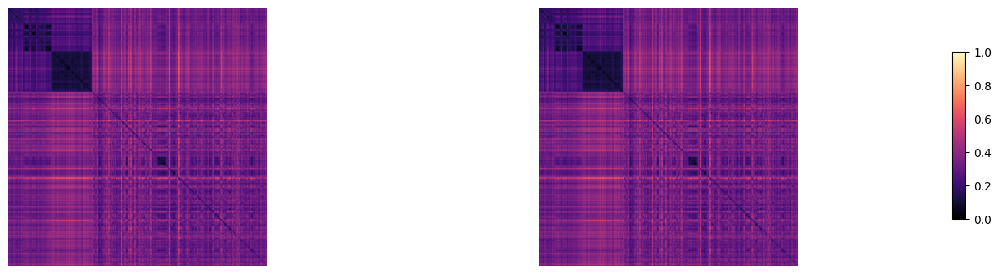

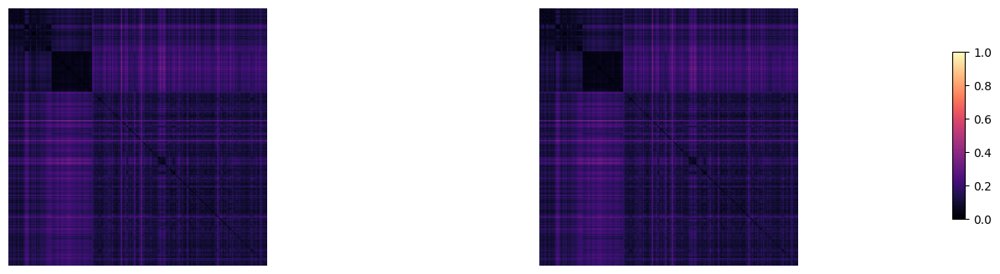

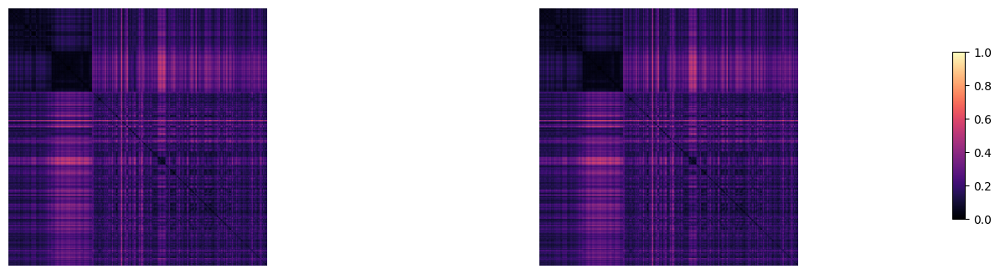

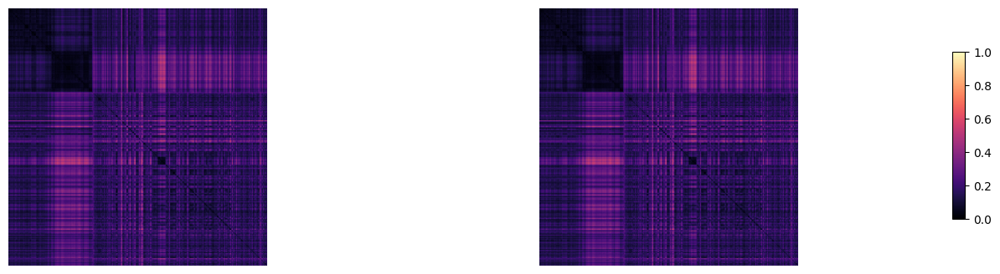

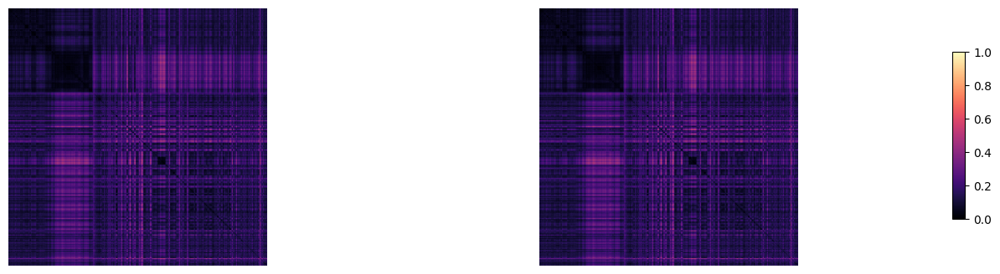

...

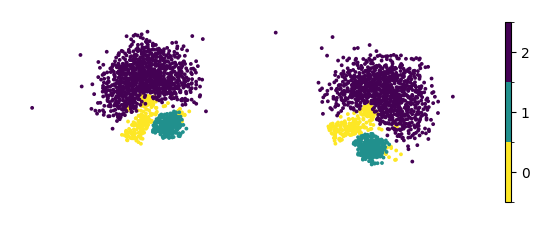

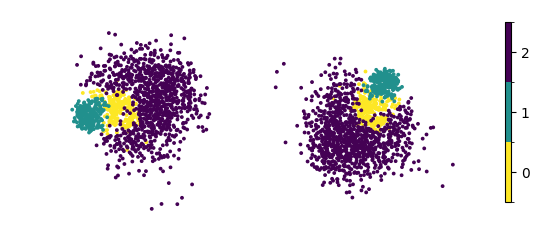

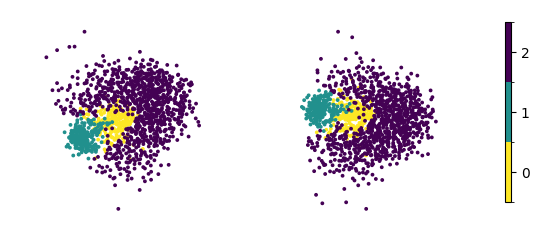

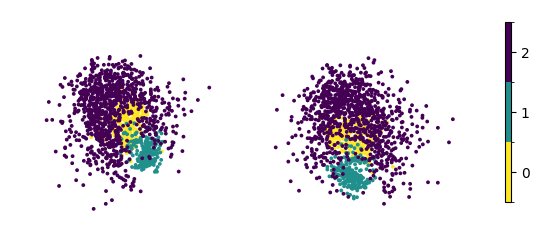

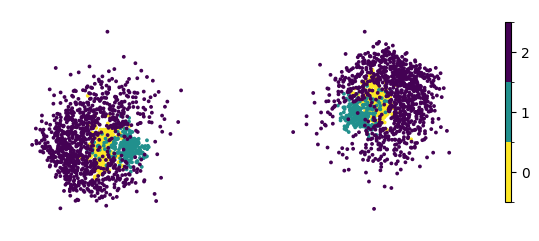

In [9]:
model, gap = load_model_path('./results/classification/imagenet_face/blt_b/run_1/')
layers = ['output_5', 'output_4', 'output_3', 'output_2', 'output_1', 'output_0']
plot_rdm_mds(model, imgs, labels, layers, num_steps=1, save=None)

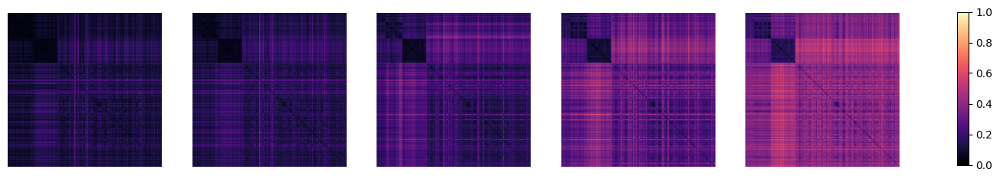

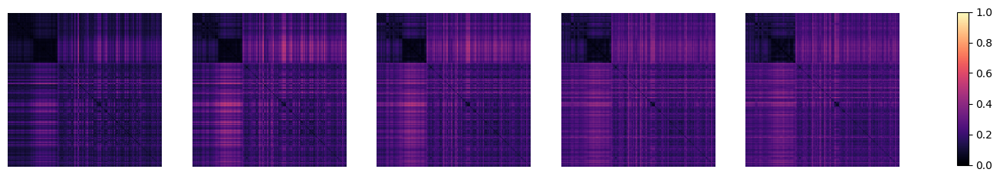

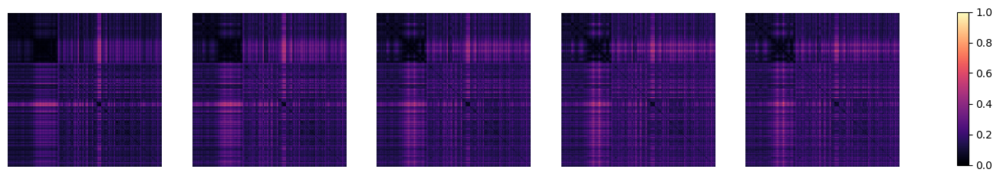

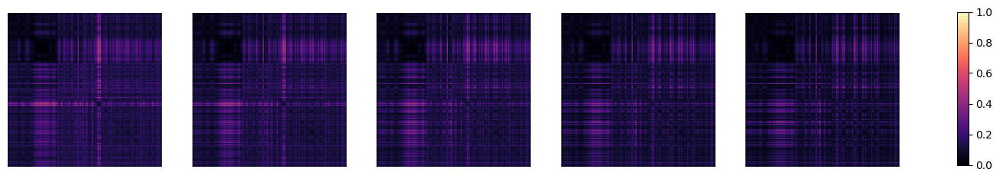

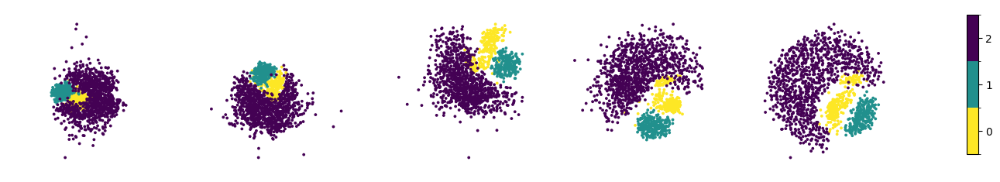

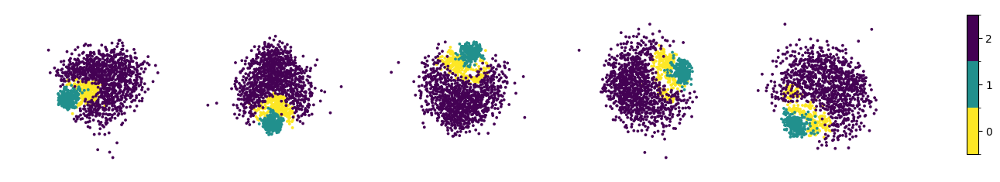

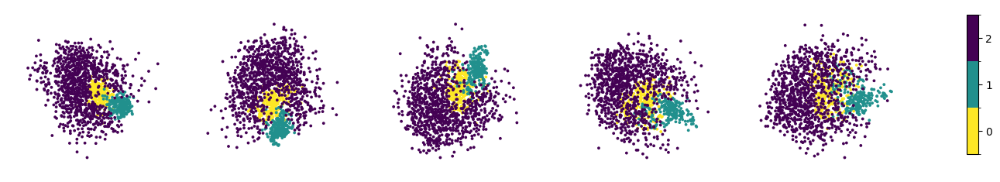

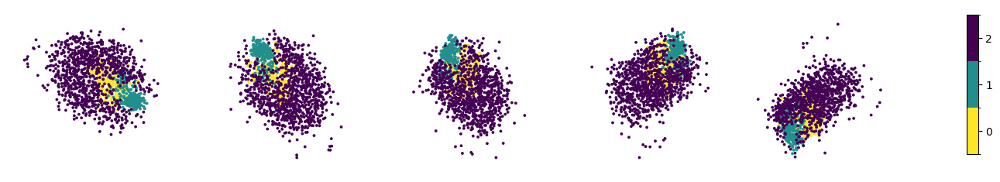

In [2]:
imgs, labels, neuro_data = kasper_dataset()
model, gap = load_model_path('./results/classification/imagenet/blt_bl/run_1/')
layers = ['output_3', 'output_2', 'output_1', 'output_0']
plot_rdm_mds(model, imgs, labels, layers, save=None)

output shape: (8, 1379, 64)
output shape: (7, 1379, 128)
output shape: (6, 1379, 256)
output shape: (5, 1379, 512)


100%|██████████| 1000/1000 [11:12<00:00,  1.49it/s]


(<Figure size 1250x1000 with 2 Axes>, <Axes: >, <Axes: >)

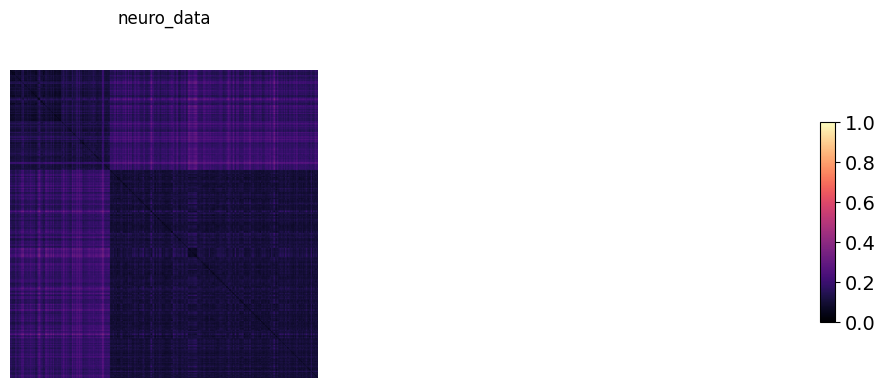

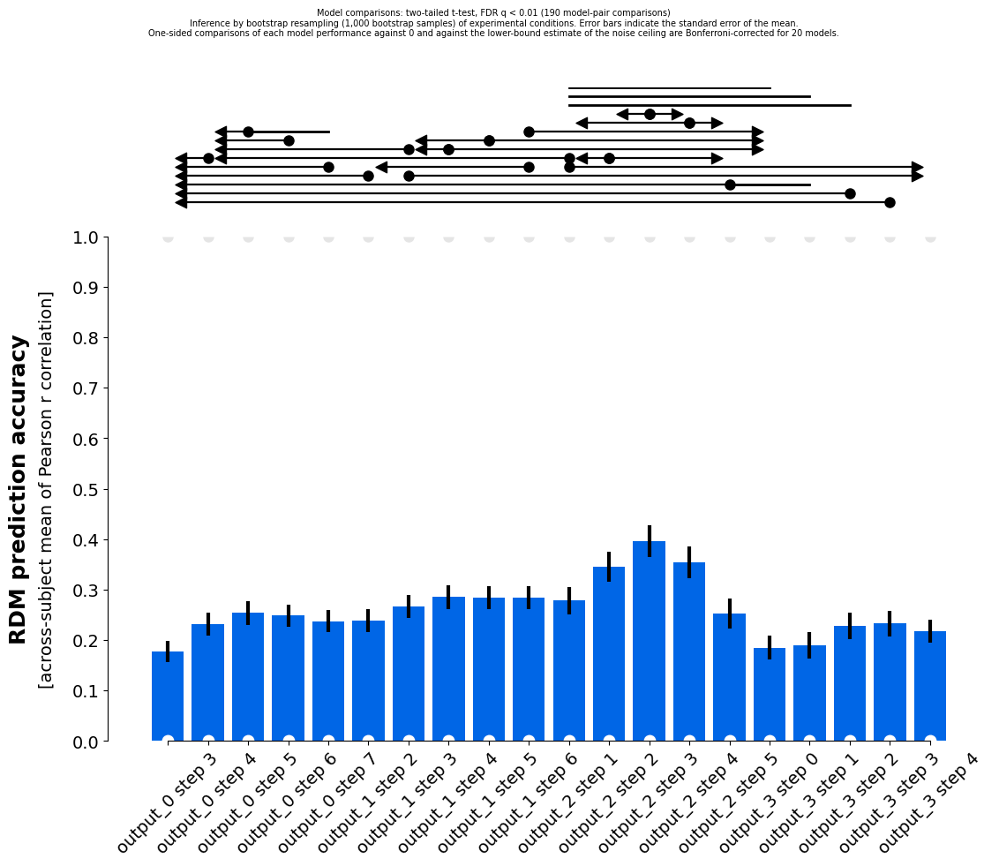

In [17]:
imgs, labels, neuro_data = kasper_dataset()

neuro_rdms, rdms_dict = calc_rdms({'neuro_data':neuro_data})
plot_maps(rdms_dict)

pred_models = []

for layer in ['output_0', 'output_1', 'output_2', 'output_3']:
    features = extract_features(model, imgs.to(device), layer, num_steps=5)
    model_rdms, rdms_dict = calc_rdms(features)

    for model_name in list(features.keys()):
        rdm_m = model_rdms.subset('layer', model_name)
        m = rsatoolbox.model.ModelFixed(f'{layer} {model_name}', rdm_m)
        pred_models.append(m)

results = rsatoolbox.inference.eval_bootstrap_pattern(pred_models, neuro_rdms, method='corr')
rsatoolbox.vis.plot_model_comparison(results)

In [11]:
imgs, labels, neuro_data = kasper_dataset()
model, gap = load_model_path('./results/classification/imagenet_vggface2/blt_bl/run_1/')
layers = ['output_5']
results, pred_model_names = compare_rdms(model, imgs.to(device), layers, neuro_data)

results.to_dict()['evaluations'].mean(0)

56 56
56 56
56 56
56 28
28 28
28 28
28 28
28 14
14 14
14 7
7 7


AttributeError: 'numpy.ndarray' object has no attribute 'keys'